# Severe acute respiratory syndrome coronavirus 2 (SARS-CoV-2)


Proučavamo širenje virusa SARS-CoV-2 u svijetu i Hrvatskoj. Na početku je dan pregled zaraženih osoba u svijetu te prikaz zaraženih na mapi svijeta. Također, prikazani su podaci za Hrvatsku, gdje prvo analiziramo podatke i prilagođavamo eksponencijalnu funkciju podacima kako bi zaista vidjeli je li rast zaraženih u Hrvatskoj eksponencijalan. Kasnije je provedena linearna regresija nad podacima te je prikazan epidemiološki SIR model za Hrvatsku.
Projekt je dostupan na [GitHub-u](https://github.com/nesto123/MS_projekt1).

Koristimo sljedeće datasetove: 

* ECDC dataset, preuzet 10.4.2020.
* Dataset za Hrvatsku, prikupljen iz službenih izvora, dostupan na GitHub-u
* Apple mobility dataset, preuzet 21.4.2020.

###### Napomena:

 * Potrebno je instalirati `GeoPandas` module koji ćemo koristiti za prikaz mapa. 
 Naredba: `conda install -c conda-forge geopandas`, alternativno [drugi način](https://geopandas.org/install.html).
 
 * Također potrebno je instalirati i `descartes` module, naredbom: `conda install -c conda-forge descartes`.
 * Detalji o instalaciji i pokretanju dostupni su u Readme.md i na [GitHub-u](https://github.com/nesto123/MS_projekt1).
 * Za prikaz widget-a potrebno je pokrenuti bilježnicu(`Cell`->`Run All`).

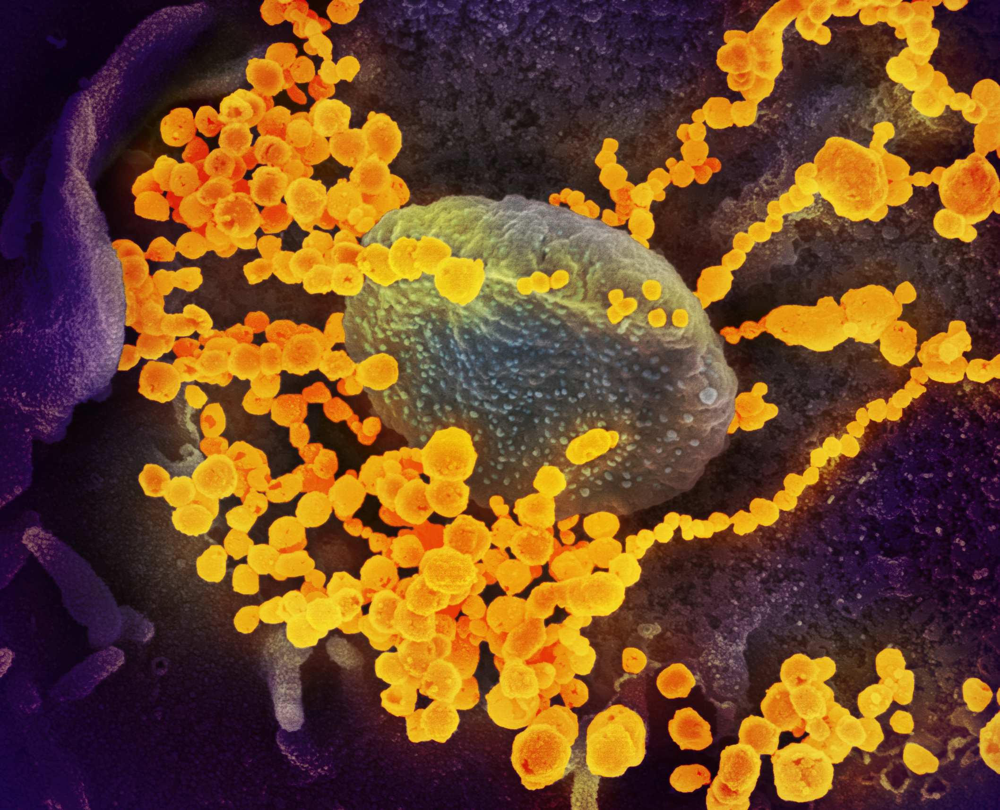

In [1]:
from __future__ import print_function
import geopandas as gpd
import ipywidgets as widgets
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.patches as patches
import pylab as pl
import pandas as pd
from PIL import Image

img  = Image.open('im.jpg')  
img

<h2>Globalni podaci</h2>


Virus SARS-CoV-2 dosad je potvrđen u preko 100 zemalja diljem svijeta, u ovom poglavlju prikazat ćemo globalne podatke o broju inficiranih osoba te  podatke o geografskoj rasprostranjenosti.
<p>Promotrimo globalne podatke o širenju virusa na dan 10.4.2020. pomoću prvog dataseta(<a href="https://www.ecdc.europa.eu/en/publications-data/download-todays-data-geographic-distribution-covid-19-cases-worldwide">ECDC-European Centre for Disease Prevention and Control</a>) koji ima sljedeći oblik.</p>



In [2]:
ecdc = pd.read_csv('6nDmODP4.csv',encoding='utf-8')
ecdc.dateRep = pd.to_datetime(ecdc['dateRep'], dayfirst=True)

# Priprema datastea (odbacujemo podatke koji nam nisu od interesa).
ecdc=ecdc.rename(columns={"countriesAndTerritories":"Country", "dateRep":"Date"})
del ecdc['day'], ecdc ['month'], ecdc['year'], ecdc ['countryterritoryCode']

print("Broj evidentiranih zaraženih osoba u svijetu: ", ecdc['cases'].sum())
print( "Broj evidentiranih umrlih osoba u svijetu: ", ecdc['deaths'].sum())
ecdc.head()

Broj evidentiranih zaraženih osoba u svijetu:  1563857
Broj evidentiranih umrlih osoba u svijetu:  95044


,Date,cases,deaths,Country,geoId,popData2018
0,2020-04-10,61,1,Afghanistan,AF,37172386.0
1,2020-04-09,56,3,Afghanistan,AF,37172386.0
2,2020-04-08,30,4,Afghanistan,AF,37172386.0
3,2020-04-07,38,0,Afghanistan,AF,37172386.0
4,2020-04-06,29,2,Afghanistan,AF,37172386.0


Priprema dataseta za prikaz oboljelih u svijetu, raspoređenim po državama.

In [3]:
def broj_slucajeva_u_zemlji(name):
    return (((ecdc.loc[ecdc['Country'] == name]).sum(axis=0))['cases']);
def broj_umrlih_u_zemlji(name):
    return (((ecdc.loc[ecdc['Country'] == name]).sum(axis=0))['deaths']);

zemlje = np.array(ecdc[['Country']].drop_duplicates())

globe = pd.DataFrame( columns=['Country', 'Cases'])

for name in zemlje:
    broj = ((ecdc.loc[ecdc['Country'] == name.item(0)]).sum(axis=0))['cases']
    globe = globe.append({'Country':name.item(0), 'Cases':broj}, ignore_index=True);

mapa = gpd.read_file(r'World_Map.shp')

Sljedeću funkciju `zamjeni` ćemo koristiti kako bi uskladili nazive zemalja, kasnije i  županija u Hrvatskoj, u datasetovima koje proučavamo sa nazivima u mapama na kojima ćemo prikazati geografsku rasproširenost visrusa.

In [4]:
def zamjeni(mapa, zamjenisa, ovozamjeni, preskoci):
    i=0
    for val in ovozamjeni:
        if val not in preskoci:
            mapa.replace(zamjenisa[i], val, inplace=True)
            i+=1
    return mapa;

# usklađujemo imena zemalja na mapi sa imenima u datasetu - spramamo različite u listu
lista = list()
for zemlja in globe['Country'].tolist():
    mapa_lista = mapa['NAME'].tolist()
    if zemlja in mapa_lista:
        pass
    else:
        lista.append(zemlja)
        
# u ecdc datasetu zamjenit ćemo sljedeće nazive zemalja
preskoci =['Cases_on_an_international_conveyance_Japan','Curaçao', 'Kosovo', 'Northern_Mariana_Islands', 
           'Saint_Kitts_and_Nevis', 'Saint_Lucia', 'Saint_Vincent_and_the_Grenadines', 'Sao_Tome_and_Principe', 
           'Sint_Maarten', 'South_Sudan', 'Timor_Leste','Trinidad_and_Tobago', 'Turks_and_Caicos_islands', 'United_States_Virgin_Islands'];
zamjenisa =['Antigua and Barbuda', 'Netherlands Antilles', 'Bosnia and Herzegovina', 'British Virgin Islands',
            'Brunei Darussalam', 'Burkina Faso', 'Cape Verde', 'Cayman Islands', 'Central African Republic', 
            'Costa Rica', 'Cote d\Ivoire', 'Czech Republic', 'Democratic Republic of the Congo', 'Dominican Republic', 
            'El Salvador', 'Equatorial Guinea', 'Swaziland', 'Falkland Islands (Malvinas)', 'Faroe Islands', 
            'French Polynesia', 'Guinea-Bissau', 'Holy See (Vatican City)', 'Iran (Islamic Republic of)', 'Isle of Man', 
            'Lao People\'s Democratic Republic', 'Libyan Arab Jamahiriya', 'Republic of Moldova', 'Burma', 'New Caledonia', 
            'New Zealand', 'The former Yugoslav Republic of Macedonia', 'Papua New Guinea', 'Puerto Rico', 'San Marino', 
            'Saudi Arabia', 'Sierra Leone', 'South Africa', 'Korea, Republic of', 'Sri Lanka', 'Syrian Arab Republic', 
            'United Arab Emirates', 'United Kingdom', 'United Republic of Tanzania', 'United States', 'Viet Nam']
mapa = zamjeni(mapa, zamjenisa, lista, preskoci)

# Usklađujemo nazive stupaca
globe.rename(columns={'Country':'NAME'}, inplace=True)

union = mapa.merge(globe, on='NAME')

<justify>Kina je zemlja u kojoj se virus prvotno pojavio te zemlja iz koje je krenula epidemija, pa pogledajmo ukupan broj slučajeva u našem datasetu za tu zemlju. </justify>

###### Napomena:
<ul>
    <li>Promatrani dataset sadrži podatke od 31.12.2019., kako je epidemija krenula nekoliko mjeseci prije u našem datasetu nisu prikazani potpuni podaci za prijašnje razdoblje.</li>
</ul>

In [5]:
union[union['NAME']=='China'][['NAME','Cases']]

,NAME,Cases
27,China,82925


Pogledajmo i koja zemlja je imala najveći broj zaraženih na dan 10.4.2020. te koliki je ukupan broj oboljelih do tada.

In [6]:
union[union['Cases']==union['Cases'].max()][['NAME', 'Cases']]

,NAME,Cases
170,United_States_of_America,466033


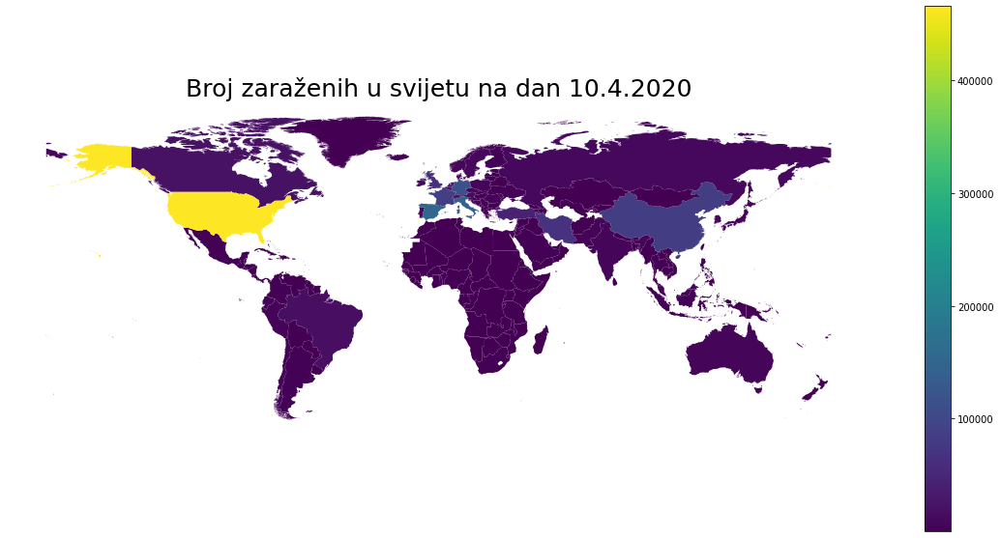

In [7]:
union['Cases'] = union['Cases'].astype('int64');

fig, ax = plt.subplots(1, 1, figsize=(20,10))
plt.axis('off')
union.plot(column='Cases', ax=ax, legend=True)
ax.set_title("Broj zaraženih u svijetu na dan 10.4.2020", fontsize=25)
plt.show()

### Ispis podataka o zaraženim i oboljelim po zemljama 

<p>Koristimo sljedeću funkciju kako bi pojednostavili daljnje korištenje <i>widget</i>-a. Za početak ispišimo podatke za Sloveniju. </p>

Broj inficiranih u Sloveniji:  1124
Broj umrlih u Sloveniji:  43


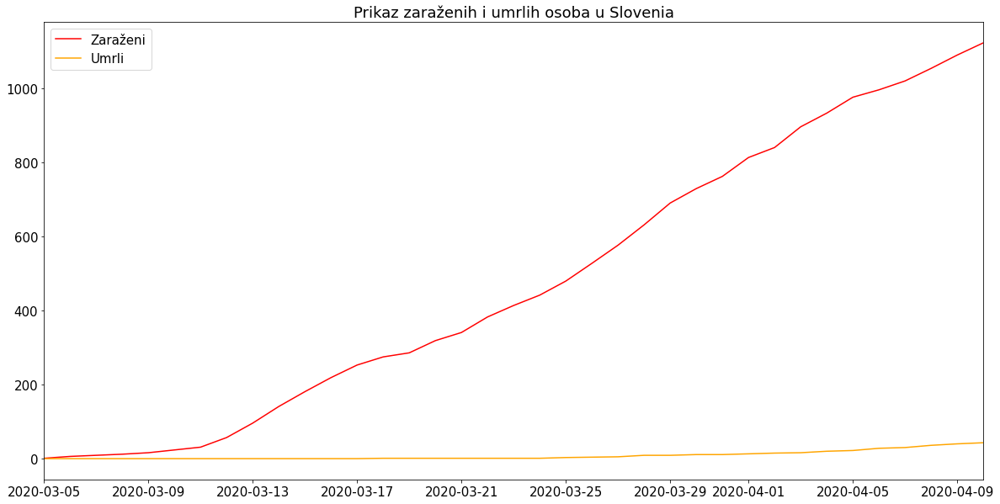

In [8]:
def print_country(name):
    if name == "":
        return;
    tmp=ecdc.loc[ecdc['Country'] == name]
    
    ukupan_broj_zarazenih, ukupan_broj_umrlih = [], []
    for date in tmp['Date'].tolist():
        ukupan_broj_zarazenih.append(tmp[tmp['Date'] <= date]['cases'].sum())
        ukupan_broj_umrlih.append(tmp[tmp['Date'] <= date]['deaths'].sum())
    tmp.insert( 6, 'Totalcases', ukupan_broj_zarazenih)
    tmp.insert( 7, 'Totaldeaths', ukupan_broj_umrlih)
    
    fig, ax = plt.subplots(figsize=(20,10))
    ax.plot(tmp['Date'], tmp['Totalcases'], label="Zaraženi", color="red")
    ax.plot(tmp['Date'], tmp['Totaldeaths'], label="Umrli", color="orange")
    ax.set_xlim(tmp.Date.min(), tmp.Date.max())
    ax.set_title("Prikaz zaraženih i umrlih osoba u "+ name)
    ax.legend()
    return fig

plt.rcParams.update({'font.size': 15})
print("Broj inficiranih u Sloveniji: " ,broj_slucajeva_u_zemlji('Slovenia'))
print("Broj umrlih u Sloveniji: ",broj_umrlih_u_zemlji('Slovenia'))
print_country('Slovenia')
plt.show()

<p>U sljedećem <i>drop-down</i> meniju odaberite zemlju za koju želite ispisati podatke o inficiranim osobama:</p>

In [9]:
dropdown = widgets.Dropdown( options=list(ecdc.Country.drop_duplicates()))
output = widgets.Output()

def obradi(name):
    output.clear_output()
    with output:
        print("Broj inficiranih osoba u "+name.new+": " ,broj_slucajeva_u_zemlji(name.new))
        print("Broj umrlih u "+name.new+": ",broj_umrlih_u_zemlji(name.new))
        print_country(name.new)
        plt.show()
        
dropdown.observe(obradi, names='value')
display(dropdown)
display(output);

Dropdown(options=('Afghanistan', 'Albania', 'Andorra', 'Algeria', 'Angola', 'Anguilla', 'Antigua_and_Barbuda',…

Output()

### Mobility data

Motivirani razmjerima epidemije poznate internacionalne IT tvrtke objavile su podatke o kretanju korisnika njihovih usluga kako bi države mogle promatrati učinak restriktivnih mjera usmjerenih ka smanjivanju broja novozaraženih osoba. U ovom poglavlju proučavamo Apple-ove podatke o mobilnosti za vrijeme trajanja epidemije. Korištenjem poznatih servisa kao što su Apple Maps te Google Maps korisnici implicitno pristaju na korištenje svojih meta-podataka navedenim kompanijama. U objavljenim podacima o fizičkom kretanju korisnika vidimo konkretne učinke restriktivnih mjera ogrničavanja kretanja u osjetnom padu  prometa. Funkcija `print_mobilnost` služi za ispis podataka o mobilnosti populacije u zemlji koju odaberemo sa sljedećeg <i>drop-down</i> menija.

In [10]:
apple = pd.read_csv('applemobilitytrends-2020-04-20.csv',encoding='utf-8')

apple = apple[apple.geo_type =='country/region']
del apple['geo_type']


def print_mobilnost(name):
    app = apple.loc[apple['region']== name]
    del app['region']
    app = app.set_index('transportation_type').T
    app.index = app.index.astype('datetime64[ns]')
    
    fig, ax = plt.subplots(figsize=(20,10))

    ax.plot(app.index, app['driving'], label='Automobili')
    ax.plot(app.index, app['walking'], label='Pješaci')
    ax.set_xlim(app.index.min(), app.index.max())
    ax.legend()
    ax.grid()
    ax.set_title('Podaci o mobilnosti za '+name)
    ax.set_ylabel('Postotak promjene [%]')
    return fig
    

dropdown2 = widgets.Dropdown( options=list(apple['region'].drop_duplicates()))
output2 = widgets.Output()

def obradi_moblinost(name):
    output2.clear_output()
    with output2:
        print_mobilnost(name.new)
        plt.show()
        
dropdown2.observe(obradi_moblinost, names='value')
print('Ispiši podatke o mobilnosti za:')
display(dropdown2)
display(output2)

Ispiši podatke o mobilnosti za:


Dropdown(options=('Albania', 'Argentina', 'Australia', 'Austria', 'Belgium', 'Brazil', 'Bulgaria', 'Cambodia',…

Output()

## Analiza podataka za Hrvatsku

U ovom poglavlju analizirat ćemo podatke o zaraženim osobama u Hrvatskoj. Koristimo dataset sa podacima o zaraženim osobama u Hrvatskoj, dostupan na [GitHubu](https://github.com/nesto123/MS_projekt1/blob/master/time-series.csv) (u slučaju da link ne radi, spremljena je lokalna kopija u repozitoriju). Na prvoj slici prikazan je broj zaraženih, umrlih i ozdravljenih osoba po danima, a na drugoj prikaz mobilnosti stanovništva u Hrvatskoj izraženoj u postocima uzimajući kao polaznu vrijednost(<i>baseline</i>) mobilnost stanovništva na dan 15.1.2020.

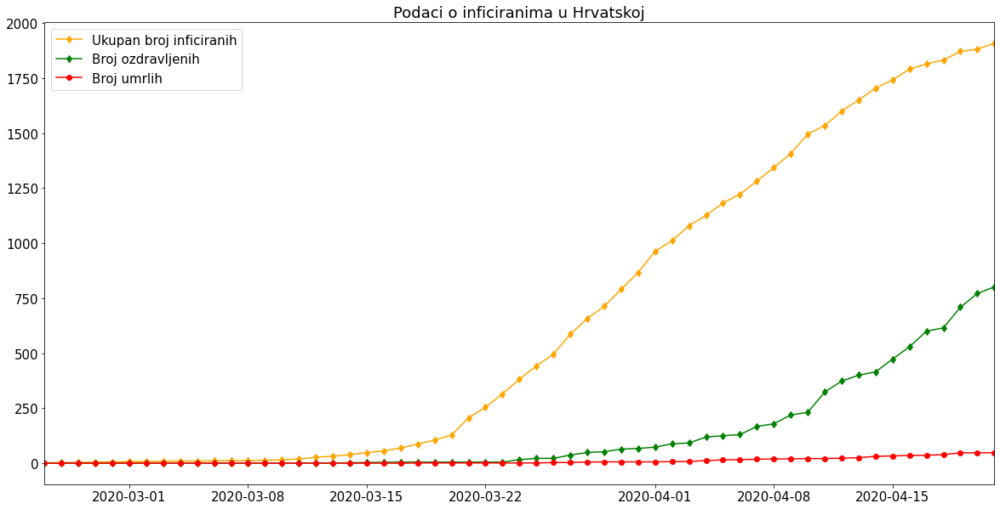

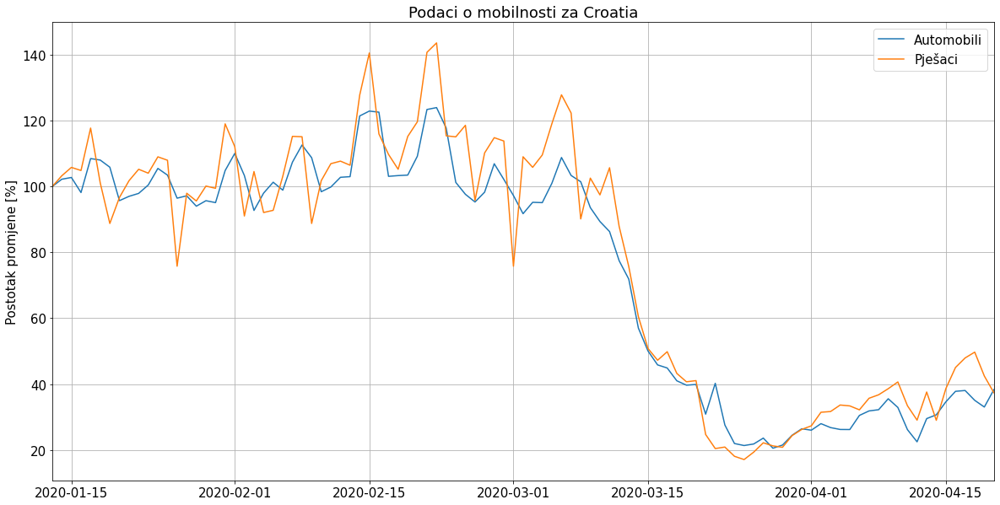

In [11]:
hr = pd.read_csv('https://raw.githubusercontent.com/nesto123/MS_projekt1/master/time-series.csv' )

# backup - u slučaju da podaci nisu dostupni online dostupna je lokalna verzija
#hr = pd.read_csv('time-series.csv',encoding='utf-8')

hr.Date = pd.to_datetime(hr['Date'], dayfirst=True)
hr.dropna(inplace=True);

fig2, ax2 = plt.subplots(figsize=(20,10))
ax2.plot(hr.Date, hr.TotalCases, label='Ukupan broj inficiranih', marker='d',color="orange")
ax2.plot( hr.Date, hr.TotalRecovered, label='Broj ozdravljenih',marker='d', color="green"), 
ax2.plot( hr.Date, hr.TotalDied, label="Broj umrlih", marker='o',color="red")
ax2.legend()
ax2.set_title('Podaci o inficiranima u Hrvatskoj')
ax2.set_xlim(hr.Date.min(), hr.Date.max())
plt.show()

print_mobilnost('Croatia')
plt.show()

Na sljedećoj slici prikazan je dnevni prirast novo-zaraženih osoba u Hrvatskoj.

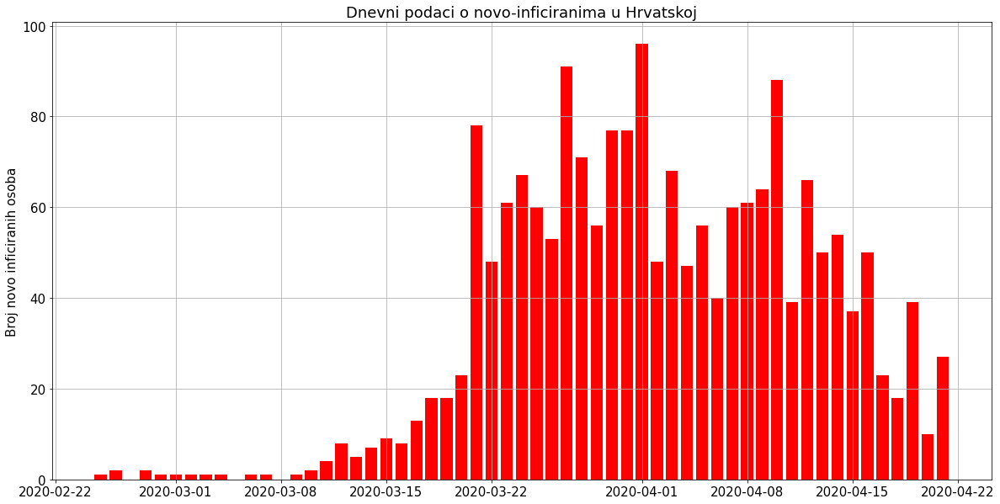

In [12]:
sorted_ = hr.sort_values('Date')

fig, ax = plt.subplots(figsize=(20, 10))
ax.bar(x=sorted_.Date, height=sorted_.NewCases, color="red")
ax.set_title("Dnevni podaci o novo-inficiranima u Hrvatskoj")
ax.grid(True)
ax.set_ylabel('Broj novo inficiranih osoba')
plt.show()

Sada koristimo dataset o zaraženim osobama  po županijama koji je dostupan na [GitHub-u](https://github.com/viborccom/data/blob/master/covid-19/croatia/time-series-counties.csv), kao i prethodno u slučaju da je dataset nedostupan postoji lokalna kopija u repozitoriju. Također kao i prije koristimo `GeoPandas` za vizualizaciju podataka.
Na slijedećoj mapi prikazana je geografska rasprostranjenost osoba inficiranih virusom po županijama. 

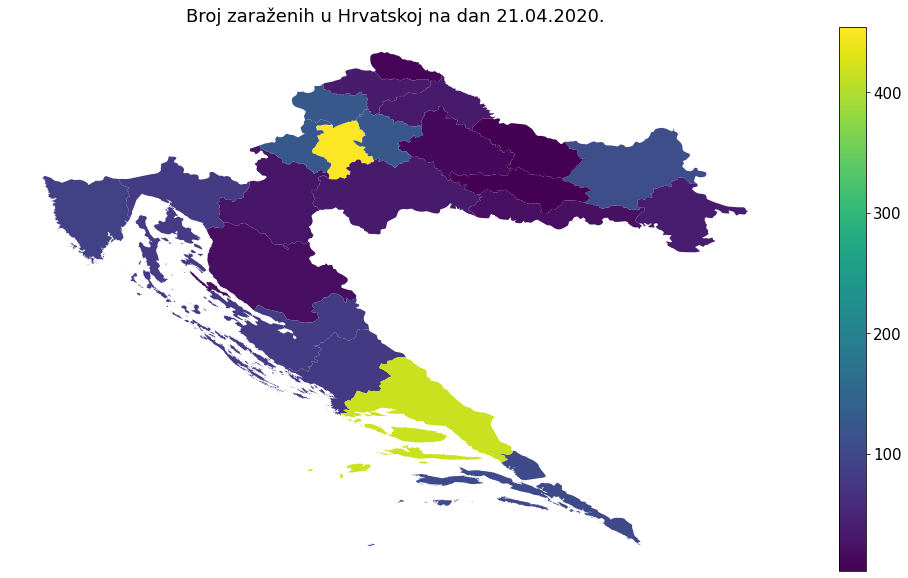

In [13]:
mapa1 = gpd.read_file(r'2.shp', encoding='utf-8')

zupanije = pd.read_csv('https://raw.githubusercontent.com/nesto123/MS_projekt1/master/time-series-counties.csv' )

# backup - u slučaju da repozitorij na githubu nije dostupan
# zupanije = pd.read_csv('time-series-counties.csv')

zupanije.dropna();
zup=pd.concat([zupanije['County'], zupanije[zupanije.columns[-1]]],
          axis=1, keys=['NAME_1', 'Cases']);

# uskladimo nazive sa onima u mapi
lista = list()
for zemlja in zup['NAME_1'].tolist():
    mapa_lista = mapa1['NAME_1'].tolist()
    if zemlja in mapa_lista:
        pass
    else:
        #print(zemlja+ 'is not in mapa_lista')
        lista.append(zemlja)

# lista
preskoci =['Hrvatska'];
zamjenisa =['Bjelovarska-Bilogorska', 'Brodsko-Posavska', 'Dubrovacko-Neretvanska','Karlovacka', 
            'Koprivničko-Križevačka', 'Krapinsko-Zagorska','Licko-Senjska', 'Medimurska', 'Osjecko-Baranjska',
            'Požeško-Slavonska', 'Primorsko-Goranska', 'Šibensko-Kninska', 'Sisacko-Moslavacka', 
            'Splitsko-Dalmatinska', 'Viroviticko-Podravska','Vukovarsko-Srijemska']
mapa1=zamjeni(mapa1, zamjenisa, lista, preskoci)

union2 = mapa1.merge(zup, on='NAME_1')

fig5, ax5 = plt.subplots(1, 1, figsize=(20,10))
plt.axis('off')
union2.plot(column='Cases', ax=ax5, legend=True)
ax5.set_title("Broj zaraženih u Hrvatskoj na dan "+hr.Date.max().strftime('%d.%m.%Y.'))
plt.show()

Na sljedećim slikama prikazana je usporedba oboljelih po županijama te sam broj oboljelih u pojedinim županijama. Dana 1.4.2020. došlo je do promjene metodologije, odnsono Zagrebačka županija je odvojena od Grada Zagreba. Iz tog razloga dolazi do prekida podataka za Zagrebačku županiju. 

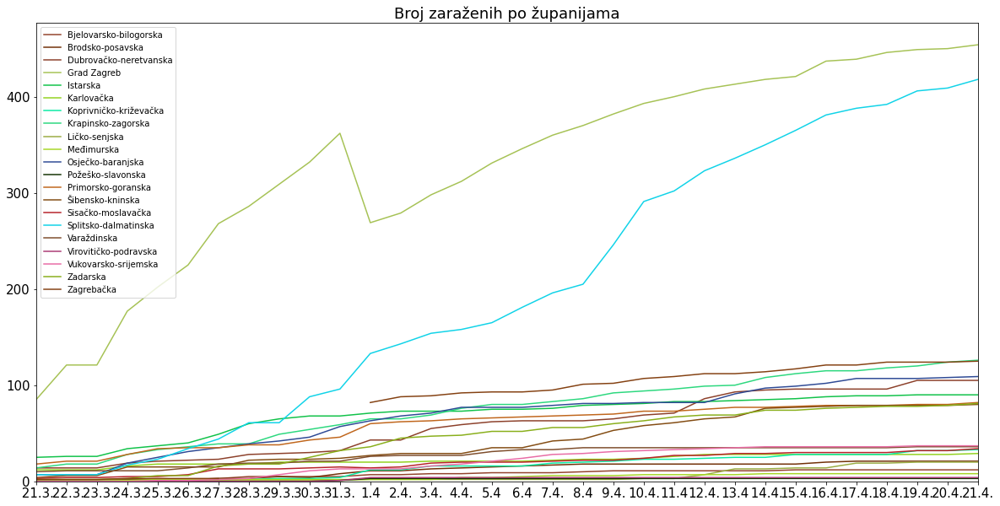

In [14]:
zup = zupanije.set_index('County').T
fig, ax = plt.subplots(figsize=(20,10))

for val in zup.columns:
    if val != 'Hrvatska':
        ax.plot(zup.index, zup[val], label=val, color=np.random.rand(3,))
ax.legend(prop={'size':'10'})
ax.set_xlim(zup.index[0], zup.index[-1])
ax.set_ylim(0)
ax.set_title('Broj zaraženih po županijama')
plt.show()

Kako bi prikazali podatke za svaku pojedinu županiju koristimo sljedeću funkciju, `print_zupanija` te pomoću <i>drop-down</i> menija odaberemo županiju za koju će se prikazati podaci.

In [15]:
def print_zupanija(name):
    fig, ax = plt.subplots(figsize=(20,10))
    ax.plot(zup.index, zup[name], label=name, color='red', marker='o')
    ax.legend()
    ax.set_xlim(zup.index[0], zup.index[-1])
    ax.set_ylim(0)
    ax.set_title('Broj zaraženih u županiji '+name)
    ax.grid()
    return fig

dropdown3 = widgets.Dropdown( options=list(zup.columns.drop_duplicates()))
output3 = widgets.Output()

def obradi_zupanija(name):
    output3.clear_output()
    with output3:
        print_zupanija(name.new)
        plt.show()
        
dropdown3.observe(obradi_zupanija, names='value')
print("Prikaži podatke za županiju: ")
display(dropdown3)
display(output3)

Prikaži podatke za županiju: 


Dropdown(options=('Bjelovarsko-bilogorska', 'Brodsko-posavska', 'Dubrovačko-neretvanska', 'Grad Zagreb', 'Ista…

Output()

### Eksponencijalni model

U sljedećem prilagođavamo eksponencijalni model našim podacima kako bi vidjeli je li u Hrvatskoj rast oboljelih osoba eksponencijalan kao u nekim zemljama. Prikazan je model za prvih 20 dana epidemije, gdje vidimo značajno odstupanje te zaključujemo da nemamo eksponencijalan rast novooboljelih u Hrvatskoj. 

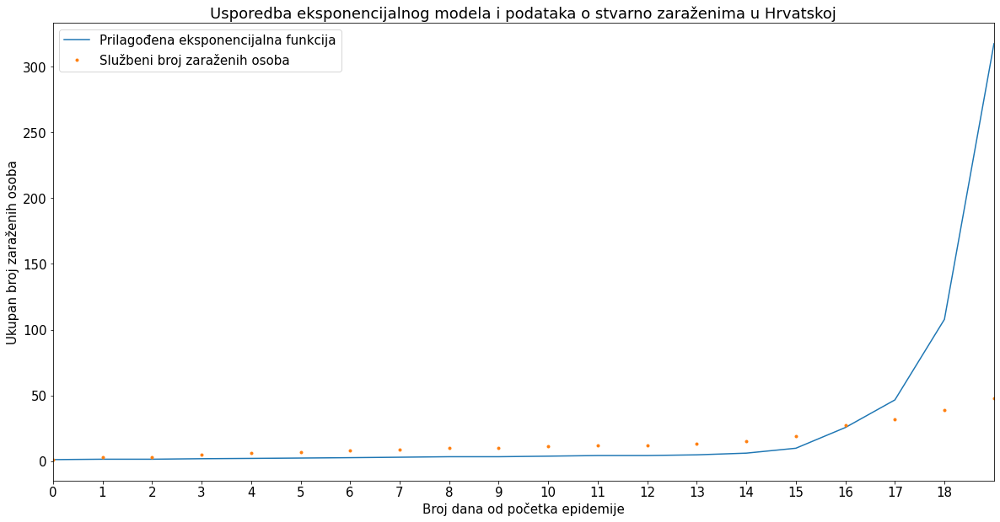

In [16]:
from statsmodels.api import OLS
from statsmodels.tools.tools import add_constant

hr2 = hr.sort_values(by='Date', ignore_index=True)

x = np.arange(len(hr2.TotalCases))
x = add_constant(x)
model = OLS(np.log(hr2.TotalCases[:20]), hr2.TotalCases[:20])

result = model.fit()
#result.summary()

fig, ax = plt.subplots(figsize=(20,10))

ax.plot(np.exp(result.predict(hr2.TotalCases[:20])), 
         label="Prilagođena eksponencijalna funkcija")
ax.plot(hr2.TotalCases[:20], ".", label="Službeni broj zaraženih osoba")
ax.legend(loc='upper left')
ax.set_xlim(0,19)
ax.set_xlabel('Broj dana od početka epidemije')
ax.set_ylabel('Ukupan broj zaraženih osoba')
ax.set_title('Usporedba eksponencijalnog modela i podataka o stvarno zaraženima u Hrvatskoj')
plt.xticks(range(0,19))
plt.show()

### Linearna regresija (Lasso) za Hrvatsku

U ovom poglavlju prikazat ćemo podatke o inficiranima u Hrvatskoj te aproksimaciju podataka koju dobijemo metodom linearne regresije(Lasso). Navedena metoda pripada strojnom učenju, tzv. nadziranom učenju. Pripadni dataset ćemo podijeliti na dva dijela, <i>trainset</i> i <i>testset</i>, pa nas model treniramo na podacima iz <i>trainset-a</i> te nakon toga uspoređujemo predviđanje koji nam model daje na <i>testset-u</i>.

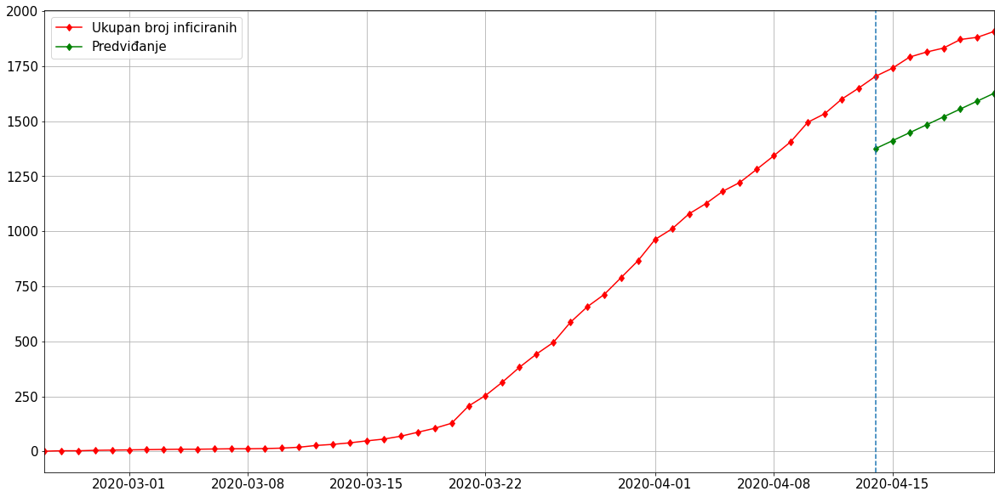

In [17]:
from sklearn import *
from sklearn.model_selection import train_test_split
from datetime import *

model = linear_model.Lasso()

x = hr.Date
x= x.map(datetime.toordinal) # sklearn ne podržava datetime
x=x.to_numpy()
y = hr.TotalCases
y=y.to_numpy()
#x-=x[-1]
x=x[::-1]#okrećemo datume tako da idu od najmanjg prema najvećem
y=y[::-1]
tmp=x[0]
x-=x[0]

#predviđanje za zadnjih 8 dana
trainsetx = x[:-8]
trainsety = y[:-8]
testsetx = x[-8:]
testsety = y[-8:]

trainsetx = trainsetx.reshape(-1,1)
trainsety = trainsety.reshape(-1,1)
testsetx = testsetx.reshape(-1,1)
testsety = testsety.reshape(-1,1)

model.fit(trainsetx, trainsety);
output4 = model.predict(testsetx)
output4.astype('int64');
vrjednosti=np.array(hr.Date[:8])[::-1];
#vrjednosti

fig3, ax3 = plt.subplots(figsize=(20,10))
ax3.plot(hr.Date, hr.TotalCases, label='Ukupan broj inficiranih', marker='d',color="red")
ax3.plot(vrjednosti, output4, label='Predviđanje', marker='d',color="green")
ax3.axvline(x=vrjednosti[0], linestyle='--')
ax3.set_xlim(hr.Date.min(), hr.Date.max())
ax3.legend()
ax3.grid()
plt.show()

Iz navedenog očita je velika greška u modelu pa zeključujemo da navedena regresija nije pogodna za proučavanje ponašanja zaraze COVID-om 19.

### Epidemiološki SIR model

Sada ćemo pomoću matematičkog modeliranja probati opsiati širenje virusa.
<b>SIR model</b> je matematički model širenja zarazne bolesti sastoji se od tri komponente, odnosno populacija je podjeljena u tri skupine:
<ol>
    <li>$S$ osjetljivi ("susceptible") - dio populacije koji je podložan zarazi.</li>
    <li>$I$ zaraženi ("infected") - dio populacije koji je koji je zaražen</li>
    <li> $R$ ozdravljeni ("recovered") - dio populacije koji je prebolio zarazu, generalno postaju imuni</li>
</ol>

Neka je $N$ veličina ukupne populacije. U daljnjem razmatranju, radi jednostavnosti, zanemarujemo prirodni prirast populaciji te migracije. Tada je jedini način da osoba iz skupine $S$ dođe u skupinu $R$ taj da se zarazi(pređe u skupinu $I$) i preboli virusnu infekciju. 
Promjena $S(t)$ ovisi o broju osjetljivih osoba u populaciji te količini socijalnog kontakta sa osobama iz skupine zaraženih $I$.Pretpostavimo da svaka zaražena osoba ima u prosjeku $b$ kontakata u danu, tada jedna zaražena osoba dnevno generira $bS(t)$ novozaraženih. Neka je $k$ koeficjet koji mjeri brzinu napuštanja skupnie zaraženih, odnosno promjenu veličine $I(t)$. Ako je trajanje bolesti u prosjeku $d$ dana, slijedi da je  $k=1/d$. Također u našem modelu je populacija konstantna, odnosno vrijedi 
vrijedi:
\begin{align}
S(t)+I(t)+R(t)=N
\end{align}

Pa naš model ima sljedeći oblik:
\begin{cases}
\frac{dS}{dt} & = -bSI \\
\frac{dI}{dt} & = bSI-kI \\
\frac{dR}{dt} & = kI
\end{cases}
Shematski prikaz modela dan je na sljedećoj slici.

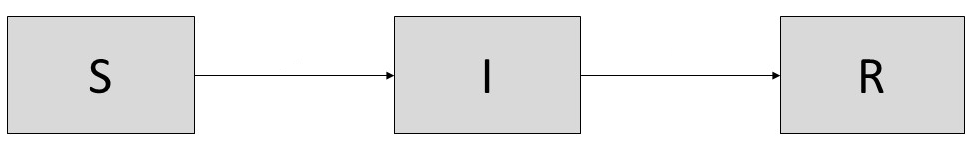

In [18]:
img  = Image.open('sir.png')  
img

In [19]:
def SIR(y,t, b, k):
    S, I, R = y
    
    dSdt = -b*S*I
    dIdt = b*S*I - k*I
    dRdt = k*I
    return ([dSdt, dIdt, dRdt])

Iz navedenog vidimo da do širenja infrkcije, odnosno do epidemije dolazi kada se povećava broj zaraženih, odnosno vrijedi:
\begin{align}
\frac{dS}{dt}  > 0 \\
bSI-ki & > 0 \\
\frac{bSI}{k}  > i
\end{align}
Na početku epidemije cijela populacija je osjetljiva pa za iz gornjez za $S=1$ dobijemo
Iz navedenog vidimo da do širenja infrkcije odnosno epidemije dolazi kada se povećava broj zaraženih, odnosno vrijedi:
\begin{align}
1 < \frac{b}{k} & = \mathcal{R_0}
\end{align}
$\mathcal{R_0}$ je osnovni reproduktivni broj, označava očekivani broj novozaraženih generiranih s jednim zaraženim u potpuno izloženoj populaciji. Kako je koeficjent $b$ teško procijeniti koristiti ćemo metodu <i>"doubleing time"</i>, odnosno proučavajući podatke vidimo da se broj inficiranih osoba udvostručio nakon četiri dana, ako ne računamo prvotnih par uvezenih slučajeva pri kojima nije bilo lokalne transmisije virusa. Također kako se pretpostavlja da je vrijeme inkubacije do pojave simptoma do dva tjedna, te ako pretpostavimo da je potrebno još otprilike dva tjedna da osoba preboli bolest dolazimo do brojke od približno 30 dana od izloženosti osobe virusu do ozdravljenja.

Na sljedećoj slici prikazan je SIR model tj. predviđanje za broj inficiranih, osjetljivih te ozdravljenih osoba, zajedno sa službenim podacima o broju inficiranih, ozdravljenih i umrlih osoba u Hrvatskoj. 

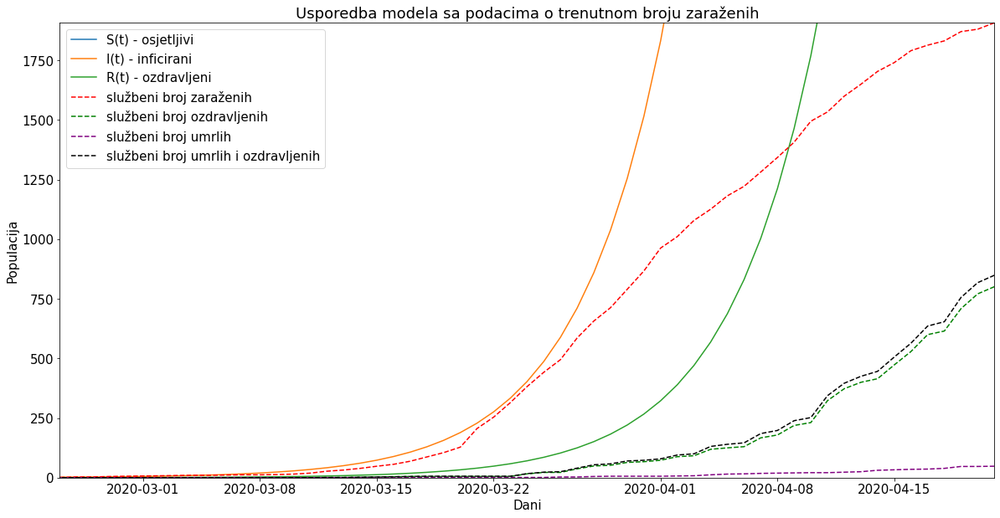

In [20]:
import scipy as sp

# funkcija za implementaciju "doubleing time"-a
def B(a, k):
    return (2**(1/a)-1+k);

N = 4060000
S0 = 1
I0 = 2/N
R0 = 0.0
k = 1/30
b = B(4, k)

# vrijeme
t = np.linspace(0,180,num=181)
solution = sp.integrate.odeint(SIR, [S0, I0, R0], t, args=(b, k))
solution = N*np.array(solution)

# Pretvorba podataka za prikaz
s = pd.Series(t)
s += datetime.toordinal(hr.Date.min())
s = s.astype('int')
s.map(datetime.fromordinal);

def print_model(fig, ax, s, solution, xlim=-1, ylim=-1):
    
    ax4.plot(s,solution[:,0], label="S(t) - osjetljivi")
    ax4.plot(s,solution[:,1], label="I(t) - inficirani")
    ax4.plot(s,solution[:,2], label="R(t) - ozdravljeni")
    ax4.set_title("Usporedba modela sa podacima o trenutnom broju zaraženih")
    ax4.plot(hr.Date, hr.TotalCases, color="red", linestyle='--', label="službeni broj zaraženih")
    ax4.plot(hr.Date, hr.TotalRecovered, color="green", linestyle='--', label="službeni broj ozdravljenih")
    ax4.plot(hr.Date, hr.TotalDied, color="purple", linestyle='--', label="službeni broj umrlih")
    ax4.plot(hr.Date, hr.TotalDied+hr.TotalRecovered, color="black", linestyle='--', label="službeni broj umrlih i ozdravljenih")

    ax4.legend()
    if xlim != -1:
        ax4.set_xlim(xlim[0], xlim[1])
    if ylim != -1:
        ax4.set_ylim(ylim[0], ylim[1])
    ax4.set_xlabel("Dani")
    ax4.set_ylabel("Populacija")
    return [fig, ax];

fig4, ax4 = plt.subplots(figsize=[20,10])
fig4, ax4 = print_model(fig4, ax4, s, solution, [hr.Date.min(), hr.Date.max()], [0,hr.TotalCases.max()])
plt.show()

Vidimo da SIR model puno bolje opisuje podatke o epidemiji u Hrvatskoj do 27.3., nakon navedenog datuma model počinje značajnije odstupat od podataka, razlog tome su mjere drastičnog socijalnog, odnosno fizičkog distanciranja uvedene 21.3.2020. Na sljedećoj slici prikazan je potpuni SIR model, za cijelo predviđano razdoblje trajanja epidemije u Hrvatskoj.

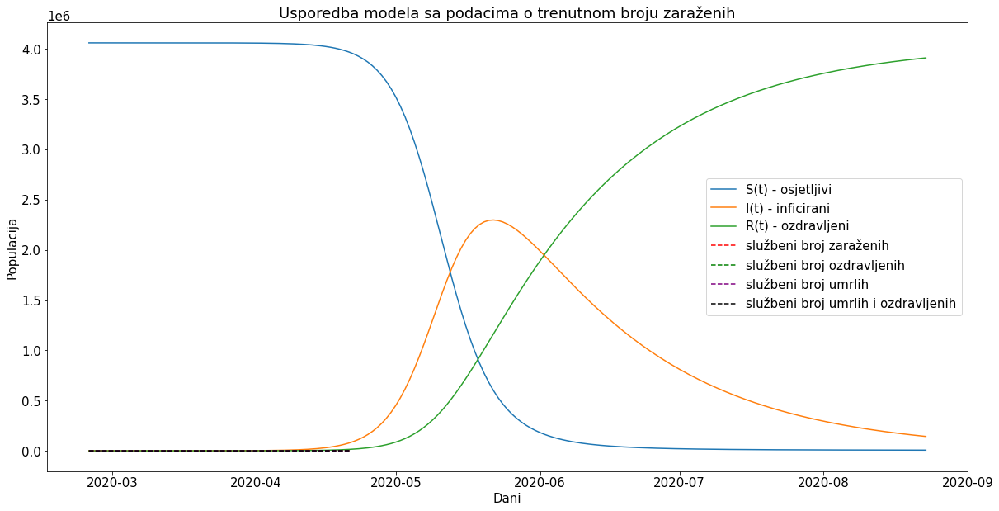

In [21]:
fig4, ax4 = plt.subplots(figsize=[20,10])
fig4, ax4 = print_model(fig4, ax4, s, solution)
plt.show()

# Literatura

* Za implementaciju widgeta korištena je službena literatura [ipywidgets](https://ipywidgets.readthedocs.io/en/latest/#)
* "Doubleing time" za SIR model [CHIME app](https://code-for-philly.gitbook.io/chime/what-is-chime/parameters) 
* Implementacija mape svijeta [GeoPandas](https://geopandas.org/)
* [ECDC](https://www.ecdc.europa.eu/en/publications-data/download-todays-data-geographic-distribution-covid-19-cases-worldwide)
* Dataset za Hrvatsku preuzet sa [GitHub-a](https://github.com/viborccom/data/tree/master/covid-19/croatia)
* Implementacija SIR modela pomoću materijala iz  [Matematičkog modeliranja u biologiji](https://web.math.pmf.unizg.hr/nastava/mmub/index.html)
* Implementacija linearne regresije Lasso pomoću [sklearn dokumentacije](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.Lasso.html)
* Mobility dataset [Apple](https://www.apple.com/covid19/mobility)